# **Pictures to sketches model**

This is our adaptation of the Face2Sketch model submitted as part of the final project for the Artificial Intelligence: Cognitive Systems course at Gothenburg University. The notebook contains the code along with some comments relevant to the work.  

### Adapted from https://www.kaggle.com/theblackmamba31/photo-to-sketch-using-autoencoder/notebook 

## Installing the packages

In [ ]:
# !pip install -q tensorflow
# !pip install -q keras
# !pip install -q opencv-

import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Dense, Conv2D, MaxPool2D, UpSampling2D, Dropout, Input
from tensorflow.keras.preprocessing.image import img_to_array
import matplotlib.pyplot as plt
import cv2
from tqdm import tqdm 
import os
import re
from matplotlib import cm
from PIL import Image

2022-01-18 16:25:24.857633: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


## Preparing the data for training

We use several simple augmentation methods which were already implemented in the original notebook. 

In [ ]:
# to get the files in proper order
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)

# defining the size of image 
SIZE = 256

image_path = '/home/guscerra@GU.GU.SE/aics-project/cuKINIJOS/all_photos_cropped'
img_array = []

sketch_path = '/home/guscerra@GU.GU.SE/aics-project/cuKINIJOS/all_sketches_cropped'
sketch_array = []

image_file = sorted_alphanumeric(os.listdir(image_path))
sketch_file = sorted_alphanumeric(os.listdir(sketch_path))

for i in tqdm(image_file):
    image = cv2.imread(image_path + '/' + i,1)
    
    # as opencv load image in bgr format converting it to rgb
    image_c = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    
    image_g = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#     copy = np.empty_like(image_c)
#     copy[:, :, 0] = image_g
#     copy[:, :, 1] = image_g
#     copy[:, :, 2] = image_g
#     image = copy
    
    # resizing images
    if not (250, 200) == image_g.shape:
        print(i)
        
    image = cv2.resize(image_g, (SIZE, SIZE))

    
    # normalizing image 
    image = image.astype('float32') / 255.0
    
    #appending normal normal image    
    img_array.append(img_to_array(image))
    # Image Augmentation
    
    # horizontal flip 
    img1 = cv2.flip(image,1)
    img_array.append(img_to_array(img1))
     #vertical flip 
    img2 = cv2.flip(image,-1)
    img_array.append(img_to_array(img2))
     #vertical flip 
    img3 = cv2.flip(image,-1)
    # horizontal flip
    img3 = cv2.flip(img3,1)
    img_array.append(img_to_array(img3))
    # rotate clockwise 
    img4 = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
    img_array.append(img_to_array(img4))
    # flip rotated image 
    img5 = cv2.flip(img4,1)
    img_array.append(img_to_array(img5))
    # rotate anti clockwise
    img6 = cv2.rotate(image, cv2.ROTATE_90_COUNTERCLOCKWISE)
    img_array.append(img_to_array(img6))
    # flip rotated image 
    img7 = cv2.flip(img6,1)
    img_array.append(img_to_array(img7))
    
    
for i in tqdm(sketch_file):
    image = cv2.imread(sketch_path + '/' + i,1)
    
    # as opencv load image in bgr format converting it to rgb
    image_c = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    image_g = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#     copy = np.empty_like(image_c)
#     copy[:, :, 0] = image_g
#     copy[:, :, 1] = image_g
#     copy[:, :, 2] = image_g
#     image = copy
    
    # resizing images 
    if not (250, 200) == image_g.shape:
        print(i)
    image = cv2.resize(image_g, (SIZE, SIZE))
    
    # normalizing image 
    image = image.astype('float32') / 255.0
    # appending normal sketch image
    sketch_array.append(img_to_array(image))
    
    #Image Augmentation
    # horizontal flip 
    img1 = cv2.flip(image,1)
    sketch_array.append(img_to_array(img1))
    
    #vertical flip 
    img2 = cv2.flip(image,-1)
    sketch_array.append(img_to_array(img2))
     #vertical flip 
    img3 = cv2.flip(image,-1)
    # horizontal flip
    img3 = cv2.flip(img3,1)
    sketch_array.append(img_to_array(img3))
    # rotate clockwise 
    img4 = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
    sketch_array.append(img_to_array(img4))
    # flip rotated image 
    img5 = cv2.flip(img4,1)
    sketch_array.append(img_to_array(img5))
     # rotate anti clockwise 
    img6 = cv2.rotate(image, cv2.ROTATE_90_COUNTERCLOCKWISE)
    sketch_array.append(img_to_array(img6))
    # flip rotated image 
    img7 = cv2.flip(img6,1)
    sketch_array.append(img_to_array(img7))

100%|██████████████████████████████████████████████████████████████████████████████| 1493/1493 [00:05<00:00, 265.00it/s]


In [ ]:
print("Total number of sketch images:",len(sketch_array))
print("Total number of images:",len(img_array))

Total number of sketch images: 11960
Total number of images: 11960


Printing several examples to verify that everything has been loaded correctly. 

In [ ]:
# defining function to plot images pair
def plot_images(image, sketches):
    plt.figure(figsize=(7,7))
    plt.subplot(1,2,1)
    plt.title('Image', color = 'green', fontsize = 20)

    copy = np.empty_like(image)
    greyscale_i = np.concatenate((image, copy), axis=2)
    greyscale_i = np.concatenate((greyscale_i, copy), axis=2)

    greyscale_i[:, :, 0] = image[:, :, 0]
    greyscale_i[:, :, 1] = image[:, :, 0]
    greyscale_i[:, :, 2] = image[:, :, 0]

    image_new = greyscale_i
    
    plt.imshow(image_new)
    
    plt.subplot(1,2,2)
    plt.title('Sketches ', color = 'black', fontsize = 20)
    
    
    copy_s = np.empty_like(sketches)
    greyscale_s = np.concatenate((sketches, copy), axis=2)
    greyscale_s = np.concatenate((greyscale_s, copy), axis=2)  
    
    
    greyscale_s[:, :, 0] = sketches[:, :, 0]
    greyscale_s[:, :, 1] = sketches[:, :, 0]
    greyscale_s[:, :, 2] = sketches[:, :, 0]

    sketches_new = greyscale_s
    
    plt.imshow(sketches_new)
   
    plt.show()

As can be seen from the examples below, some of the pictures do not exactly match the sketches in terms of how much the image is 'zoomed in'. We believe this might be the reason behind the relatively poor performance of the model.

0


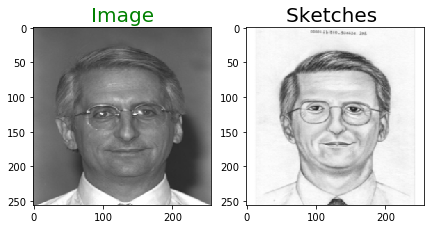

100


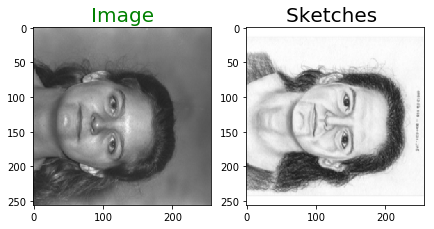

200


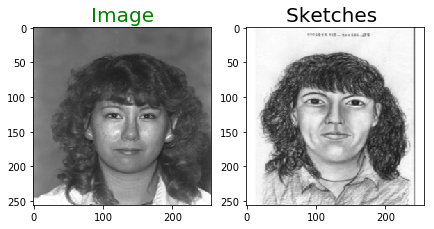

300


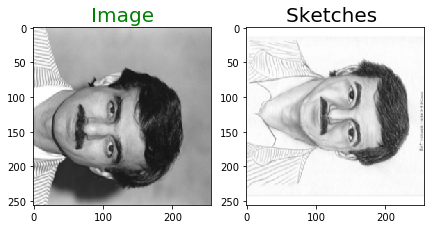

400


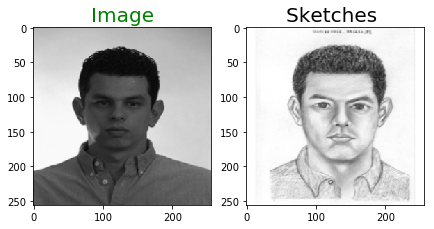

500


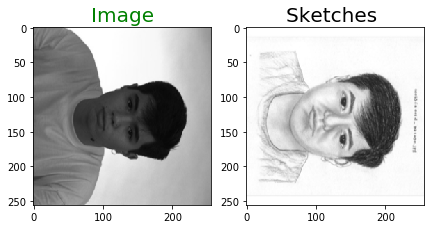

600


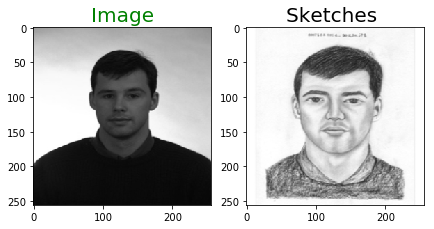

700


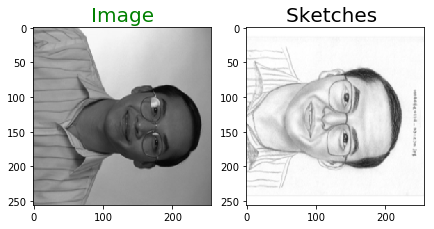

800


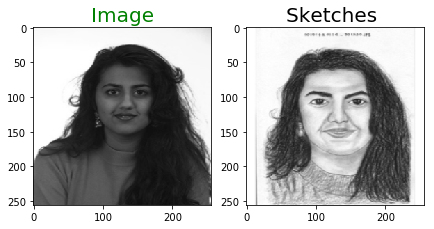

900


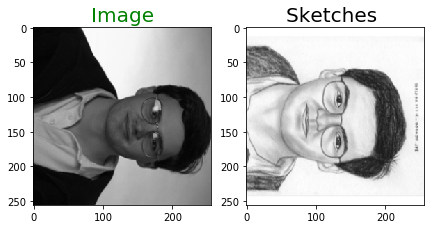

1000


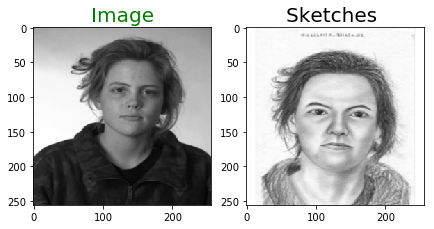

1100


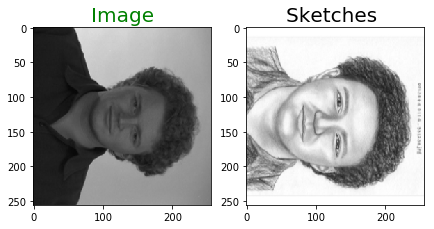

1200


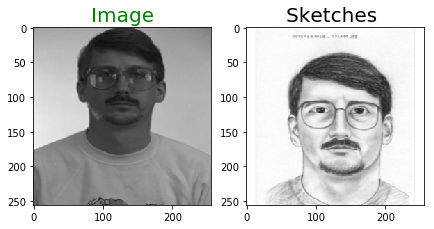

1300


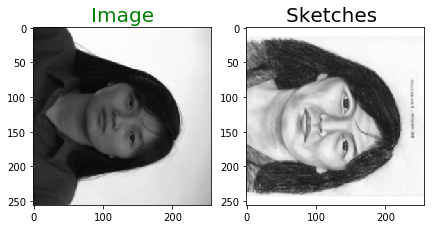

1400


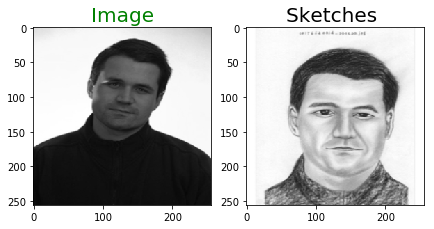

1500


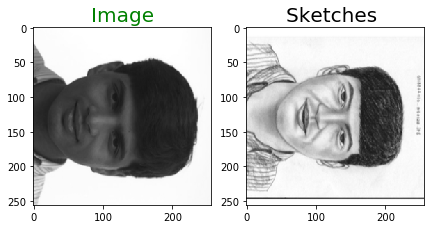

1600


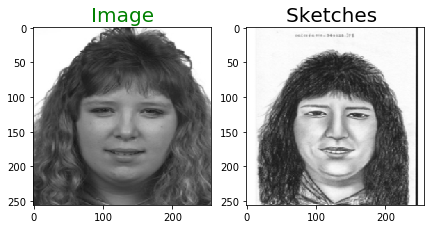

1700


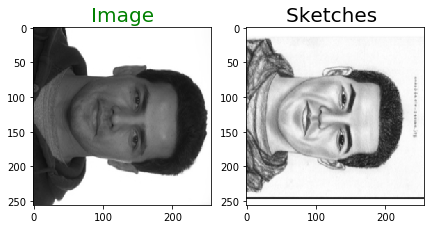

1800


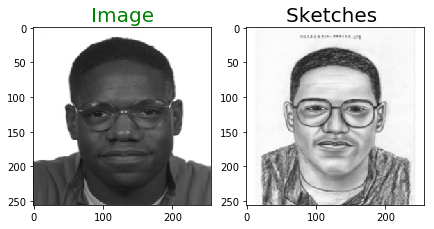

1900


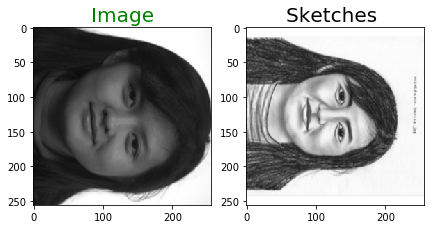

2000


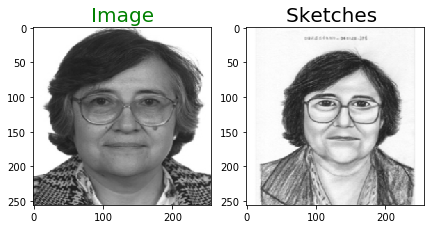

2100


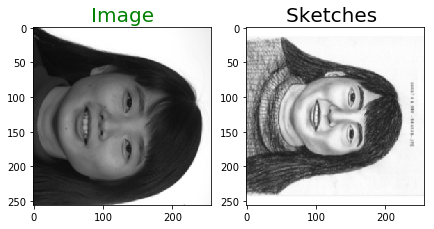

2200


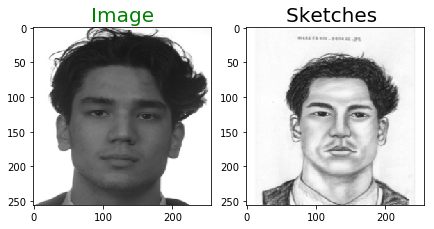

2300


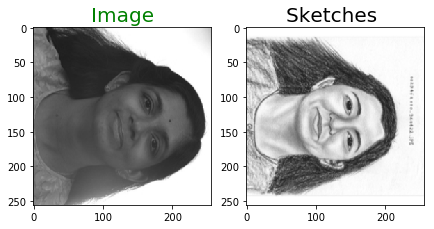

2400


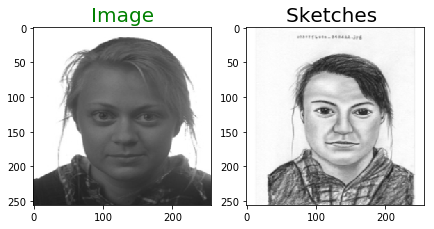

2500


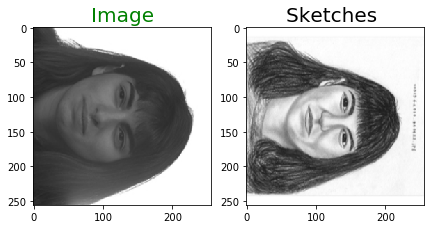

2600


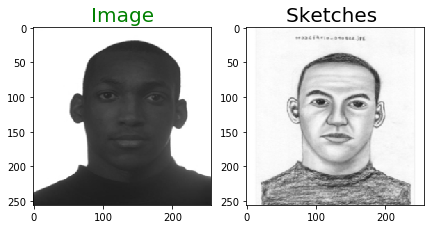

2700


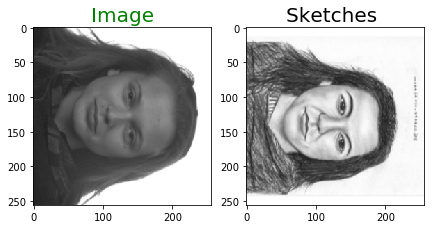

2800


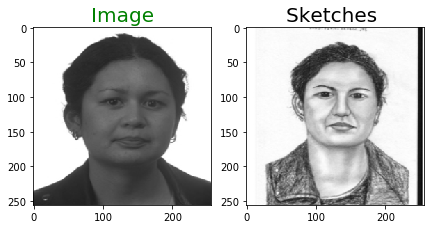

2900


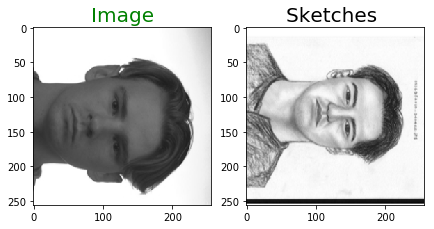

3000


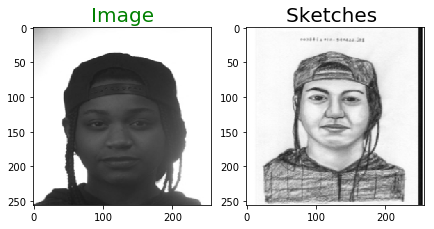

3100


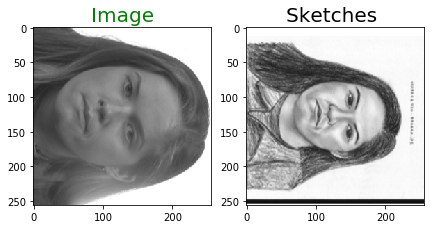

3200


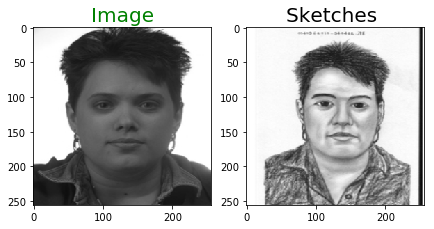

3300


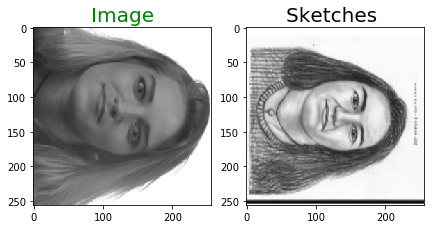

3400


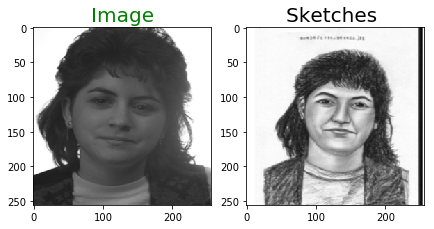

3500


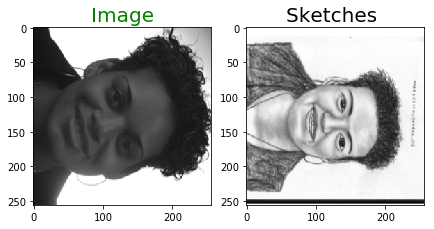

3600


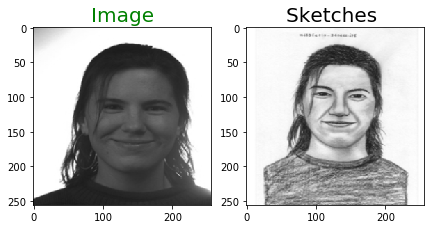

3700


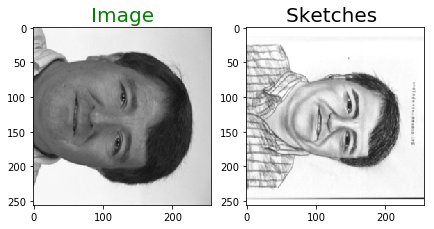

3800


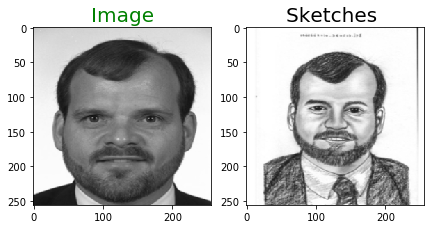

3900


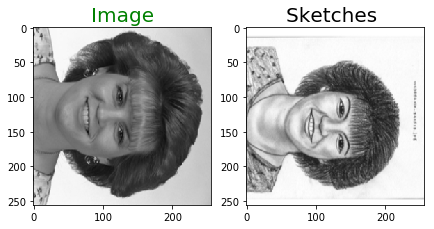

4000


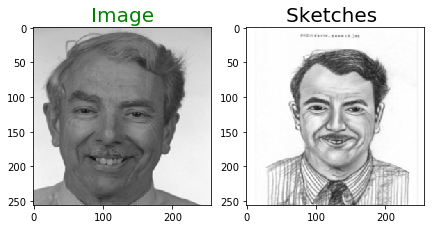

4100


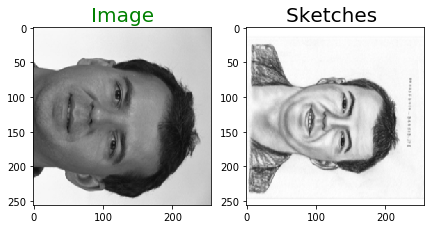

4200


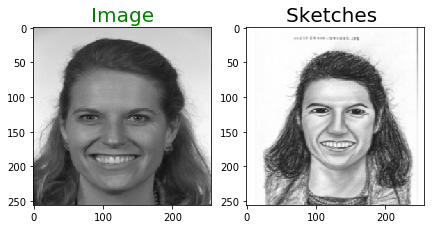

4300


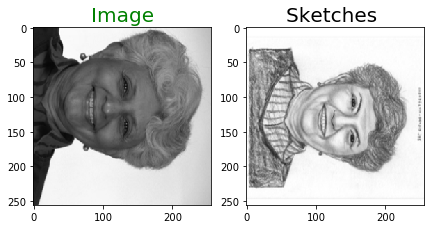

4400


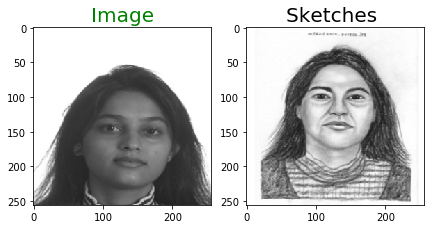

4500


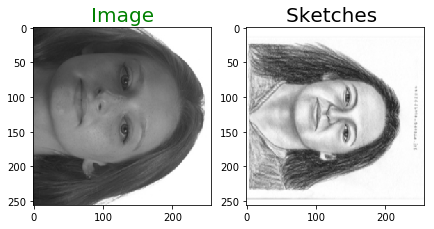

4600


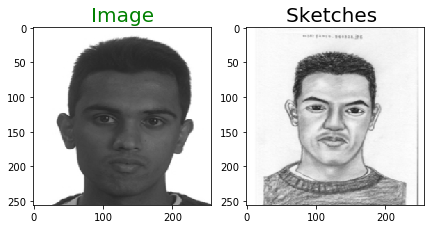

4700


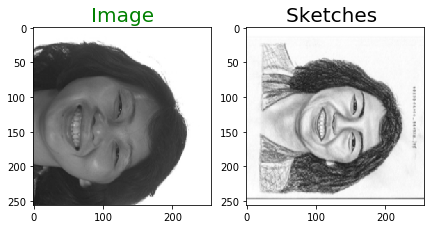

4800


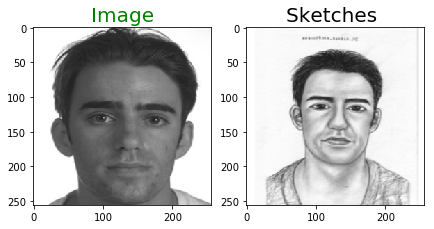

4900


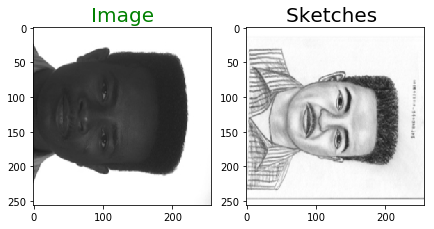

5000


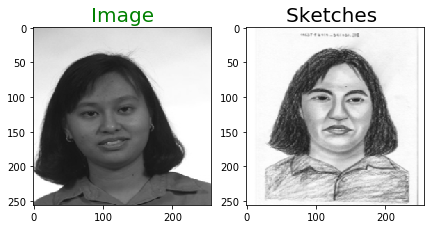

5100


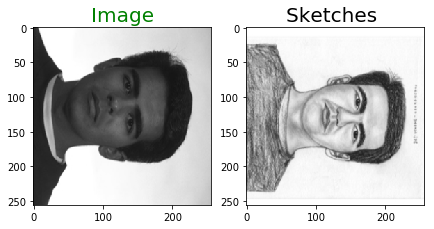

5200


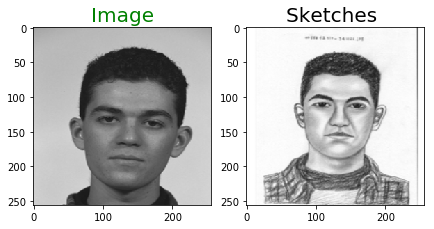

5300


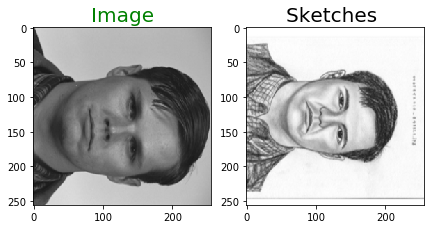

5400


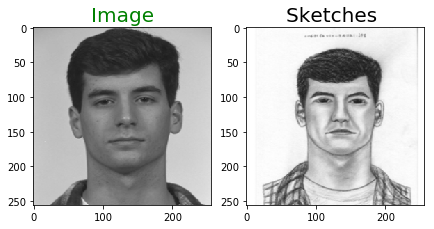

5500


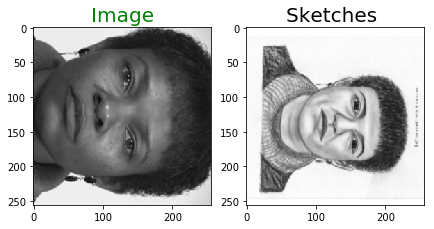

5600


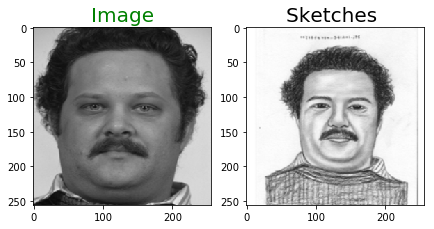

5700


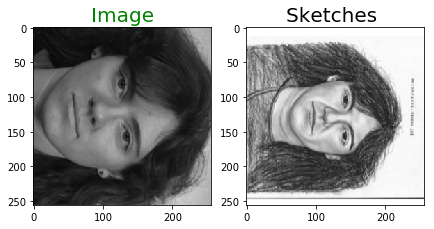

5800


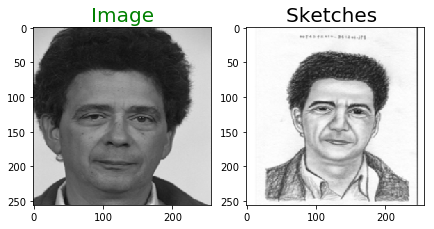

5900


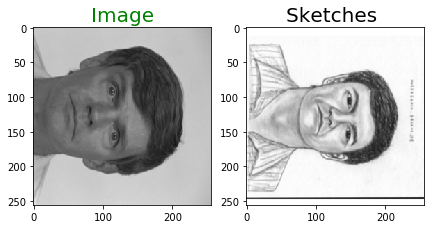

6000


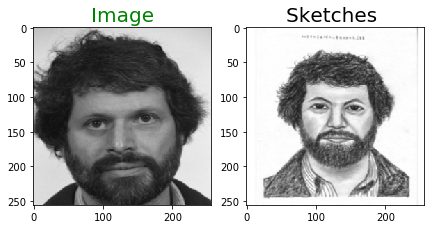

6100


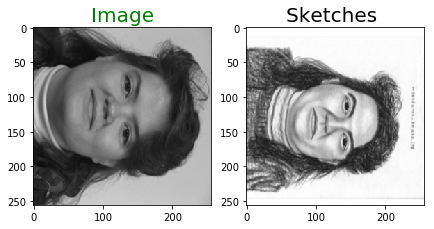

6200


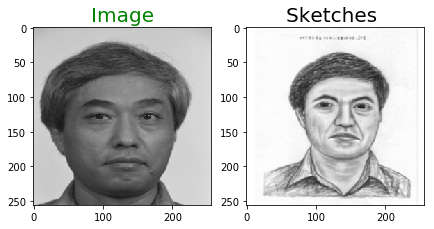

6300


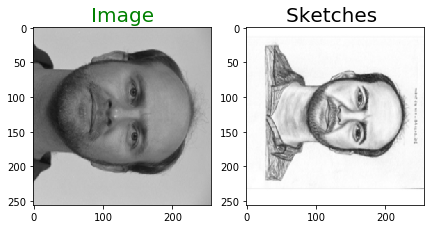

6400


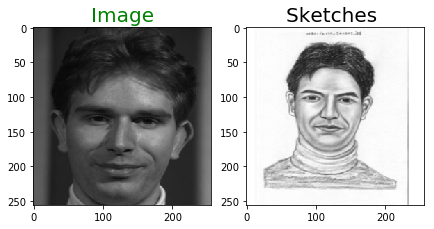

6500


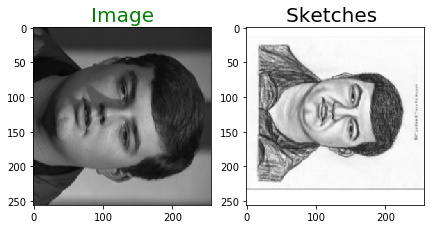

6600


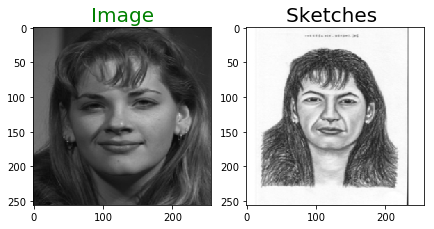

6700


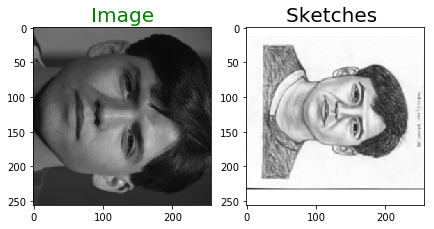

6800


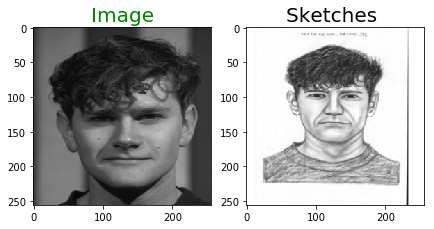

6900


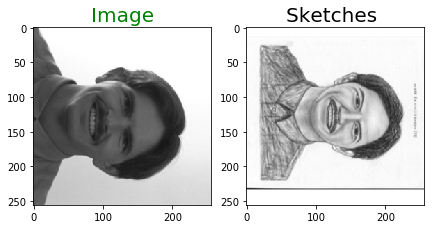

7000


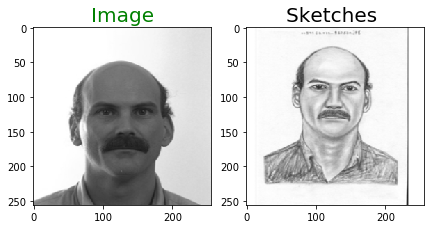

7100


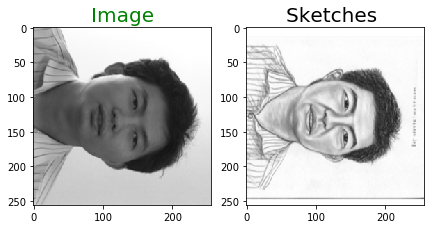

7200


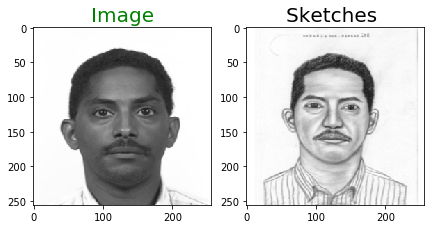

7300


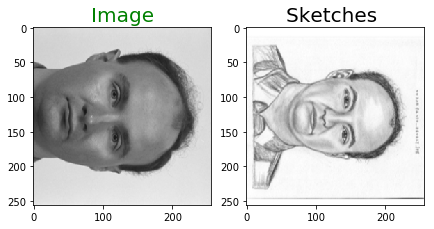

7400


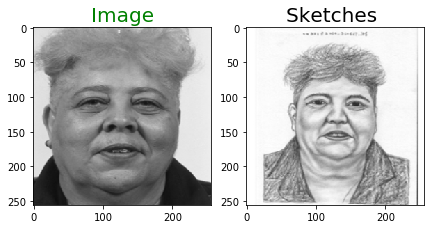

7500


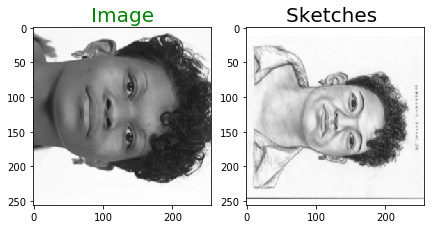

7600


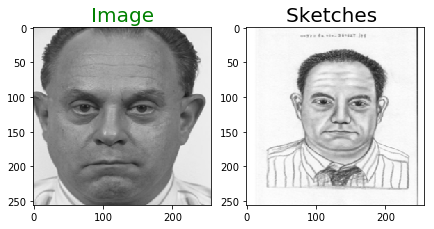

7700


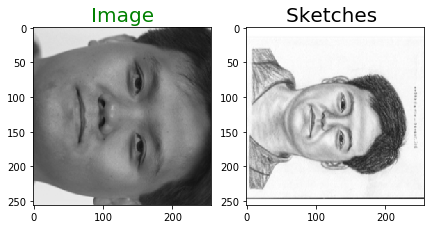

7800


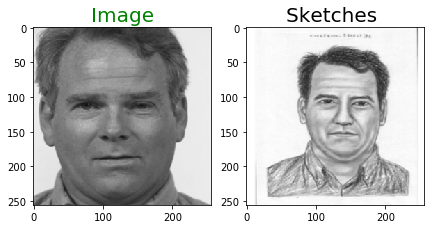

7900


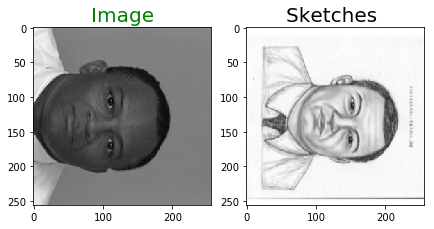

8000


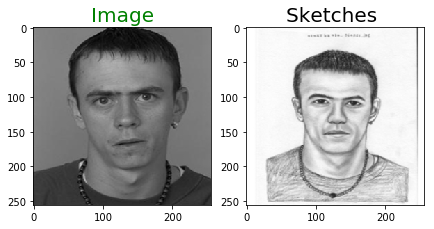

8100


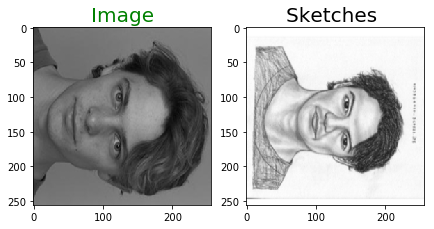

8200


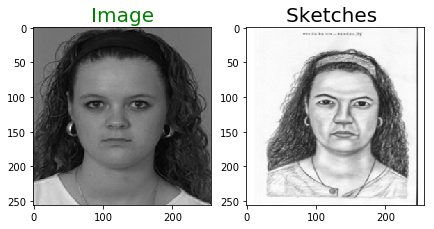

8300


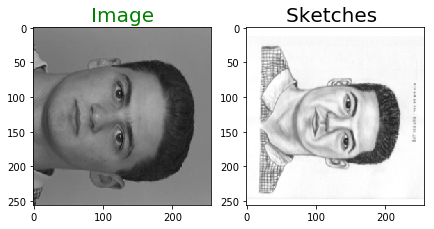

8400


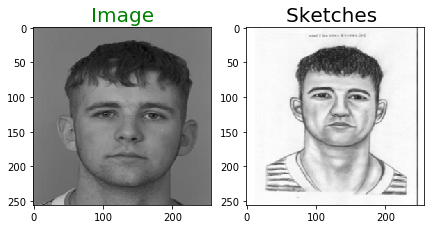

8500


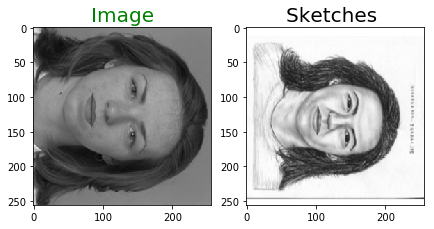

8600


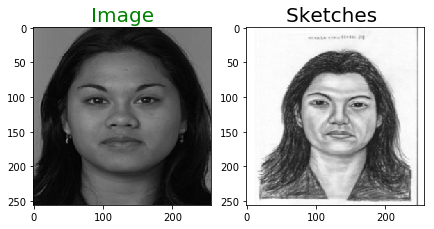

8700


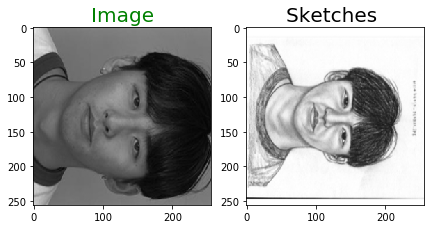

8800


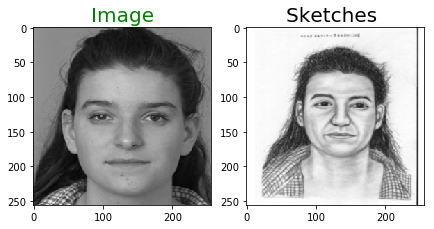

8900


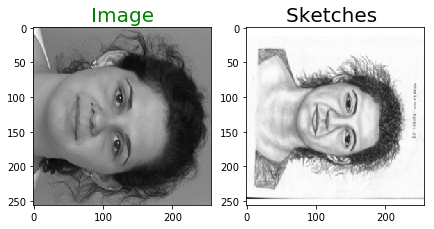

9000


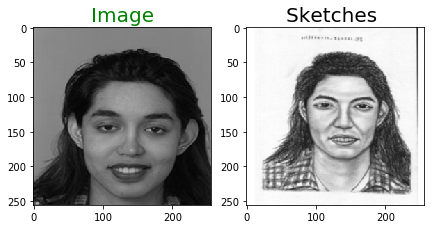

9100


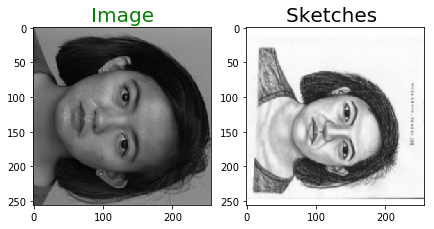

9200


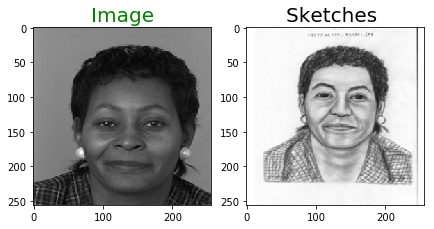

9300


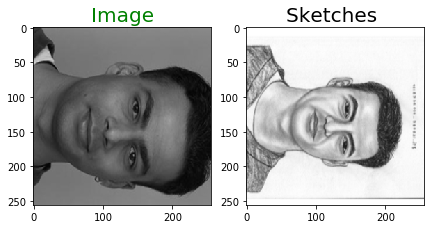

9400


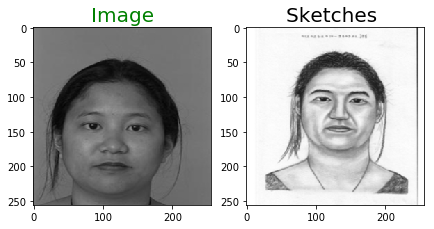

9500


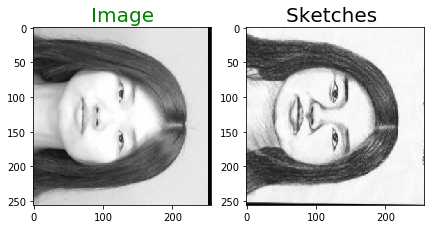

9600


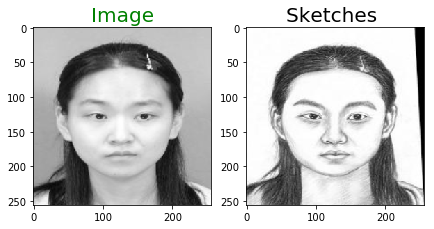

9700


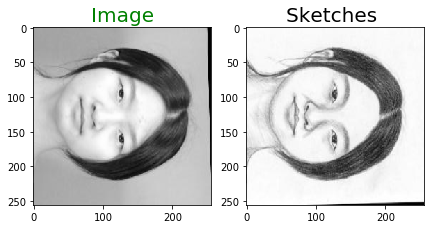

9800


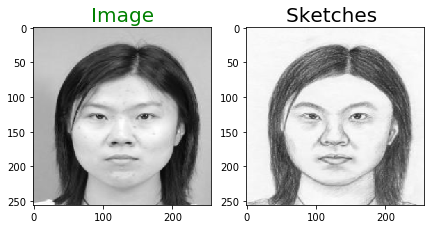

9900


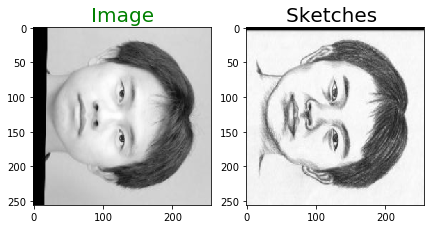

10000


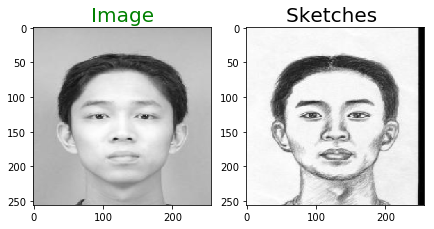

10100


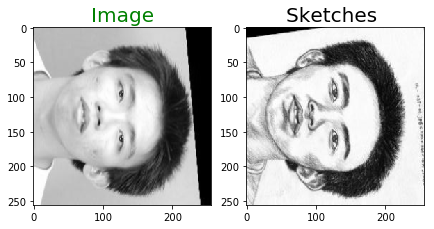

10200


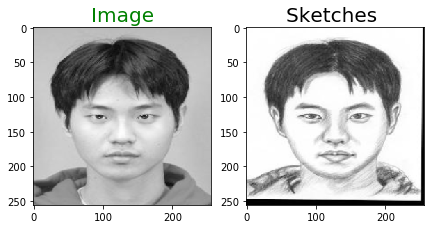

10300


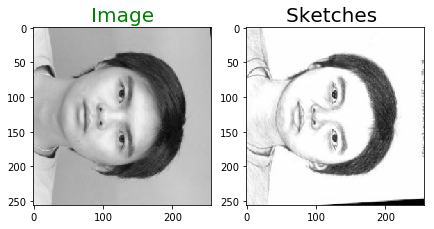

10400


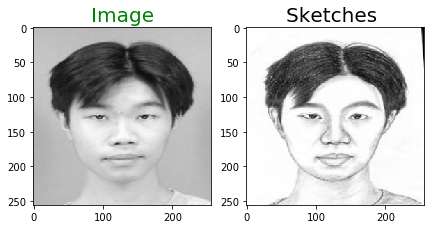

10500


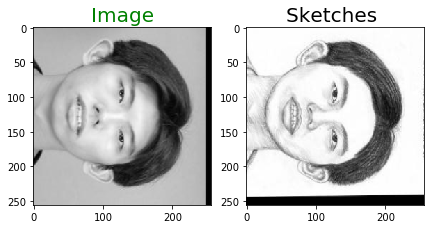

10600


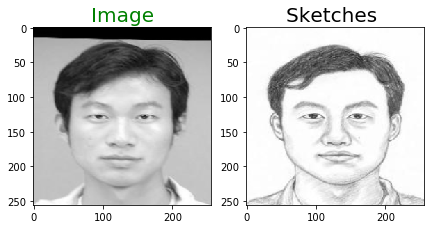

10700


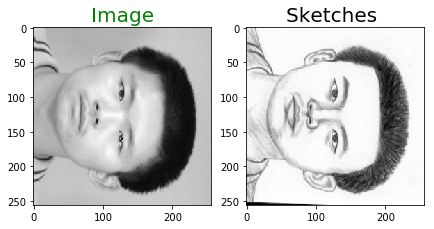

10800


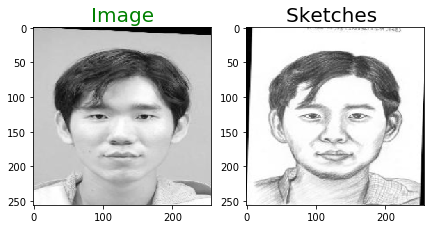

10900


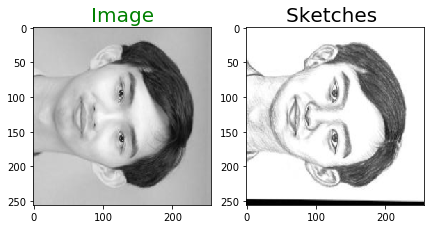

11000


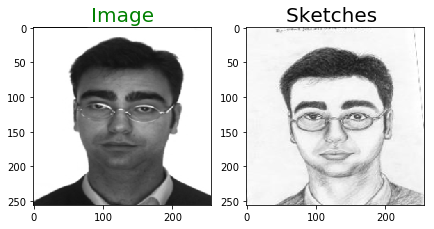

11100


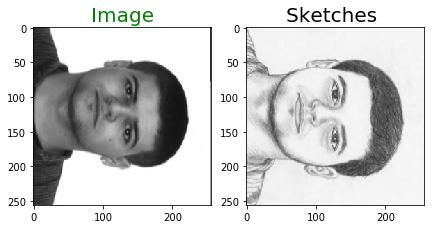

11200


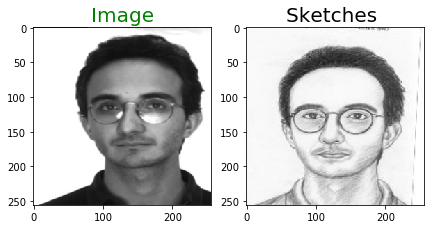

11300


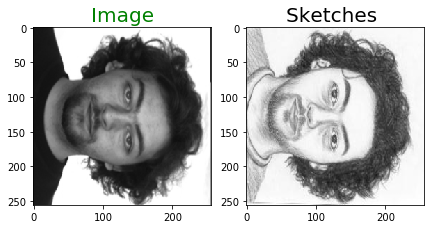

11400


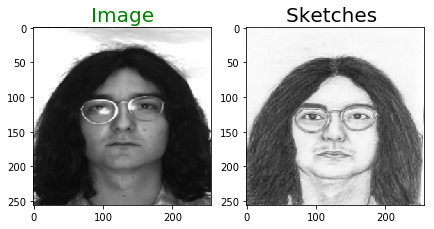

11500


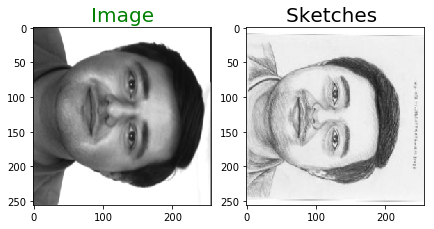

11600


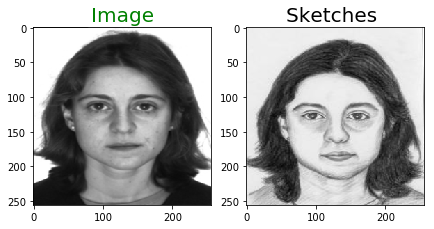

11700


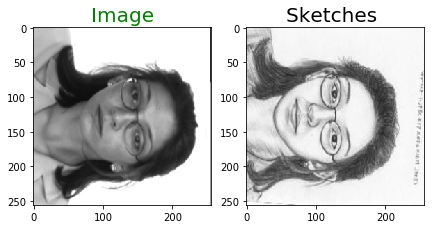

11800


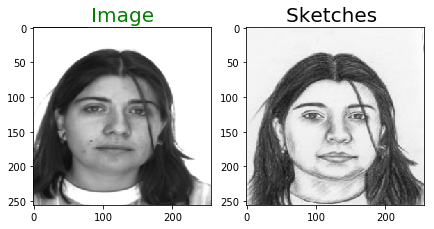

11900


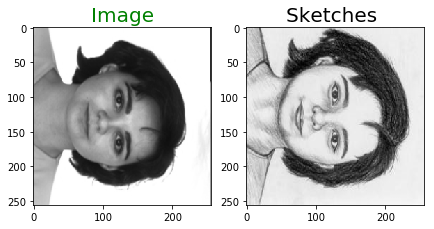

In [ ]:
ls = [i for i in range(0,11960,100)]
for i in ls:
    print(i)
    plot_images(img_array[i],sketch_array[i])

## Splitting the data into train and test 

In [ ]:
test_sketch_image  = sketch_array[0::5] # every 5th element (20%) is added to the testing set
test_image = img_array[0::5] # every 5th element is deleted from the training data

np_sketch_array = np.array(sketch_array)
np_img_array = np.array(img_array)

train_sketch_image = np.delete(np_sketch_array, list(range(0, len(np_sketch_array), 5)), axis=0)
train_image = np.delete(np_img_array, list(range(0, len(np_img_array), 5)), axis=0)

print(len(train_sketch_image))
print(len(test_sketch_image))
print(len(train_image))
print(len(test_sketch_image))

# train_sketch_image = train_sketch_image.tolist()
# train_image = train_image.tolist()

# train_sketch_image = np.reshape(train_sketch_image,(len(train_sketch_image),SIZE,SIZE,3))
# train_image = np.reshape(train_image, (len(train_image),SIZE,SIZE,3))
# print('Train color image shape:',train_image.shape)
# test_sketch_image = np.reshape(test_sketch_image,(len(test_sketch_image),SIZE,SIZE,3))
# test_image = np.reshape(test_image, (len(test_image),SIZE,SIZE,3))
# print('Test color image shape',test_image.shape)

train_sketch_image = np.reshape(train_sketch_image,(len(train_sketch_image),SIZE,SIZE,1))
train_image = np.reshape(train_image, (len(train_image),SIZE,SIZE,1))

print('Train color image shape:',train_image.shape)
test_sketch_image = np.reshape(test_sketch_image,(len(test_sketch_image),SIZE,SIZE,1))
test_image = np.reshape(test_image, (len(test_image),SIZE,SIZE,1))
print('Test color image shape',test_image.shape)

9555
2389
9555
2389
Train color image shape: (9555, 256, 256, 1)
Test color image shape (2389, 256, 256, 1)


## Several additional steps before we can use the data in our model

In [ ]:
def downsample(filters, size, apply_batch_normalization = True):
    downsample = tf.keras.models.Sequential()
    downsample.add(keras.layers.Conv2D(filters = filters, kernel_size = size, strides = 2, use_bias = False, kernel_initializer = 'he_normal'))
    if apply_batch_normalization:
        downsample.add(keras.layers.BatchNormalization())
    downsample.add(keras.layers.LeakyReLU())
    return downsample

In [ ]:
def upsample(filters, size, apply_dropout = False):
    upsample = tf.keras.models.Sequential()
    upsample.add(keras.layers.Conv2DTranspose(filters = filters, kernel_size = size, strides = 2, use_bias = False, kernel_initializer = 'he_normal'))
    if apply_dropout:
        upsample.add(tf.keras.layers.Dropout(0.1))
    upsample.add(tf.keras.layers.LeakyReLU()) 
    return upsample

# We use the standard parameters from the original notebook 

In [ ]:
def model():
    encoder_input = keras.Input(shape = (SIZE, SIZE, 1))
    x = downsample(16, 4, False)(encoder_input)
    x = downsample(32,4)(x)
    x = downsample(64,4,False)(x)
    x = downsample(128,4)(x)
    x = downsample(256,4)(x)
   
    encoder_output = downsample(512,4)(x)
    
    decoder_input = upsample(512,4,True)(encoder_output)
    x = upsample(256,4,False)(decoder_input)
    x = upsample(128,4, True)(x)
    x = upsample(64,4)(x)
    x = upsample(32,4)(x)
    x = upsample(16,4)(x)
    x = tf.keras.layers.Conv2DTranspose(8,(2,2),strides = (1,1), padding = 'valid')(x)
    
#     decoder_output = tf.keras.layers.Conv2DTranspose(3,(2,2),strides = (1,1), padding = 'valid')(x)
    decoder_output = tf.keras.layers.Conv2DTranspose(1,(2,2),strides = (1,1), padding = 'valid')(x)

    
  
    return tf.keras.Model(encoder_input, decoder_output)

In [ ]:
# to get summary of model
model = model()
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 256, 256, 1)]     0         
_________________________________________________________________
sequential_12 (Sequential)   (None, 127, 127, 16)      256       
_________________________________________________________________
sequential_13 (Sequential)   (None, 62, 62, 32)        8320      
_________________________________________________________________
sequential_14 (Sequential)   (None, 30, 30, 64)        32768     
_________________________________________________________________
sequential_15 (Sequential)   (None, 14, 14, 128)       131584    
_________________________________________________________________
sequential_16 (Sequential)   (None, 6, 6, 256)         525312    
_________________________________________________________________
sequential_17 (Sequential)   (None, 2, 2, 512)         2099

In [ ]:
# ## Model
# Here I have defined two blocks of networks. Encoder network takes 256 by 256 image and downsample it to 16 by 16 latent vector
# by passing our image via series of Convolution and Maxpooling layer. This downsampled 16 by 16 latent vector is upsampled by passing 
# through series of Convolution and UpSampling layer. The final decoder output is same as our encoder input. This upsamples output of decoder
# is compared with our sketches and reconstruction loss is calculated. This loss is minimized by updating weight and bias of network through
# backpropagation.
# encoder_input = keras.Input(shape=(SIZE,SIZE, 3), name="img")
# x = Conv2D(filters = 16, kernel_size = (3,3), activation = 'relu', padding = 'same')(encoder_input)
# x = MaxPool2D(pool_size = (2,2))(x)

# x = Conv2D(filters = 32,kernel_size = (3,3),strides = (2,2), activation = 'relu', padding = 'valid')(x)
# x = Conv2D(filters = 64, kernel_size = (3,3), strides = (2,2), activation = 'relu', padding = 'same')(x)
# x = MaxPool2D(pool_size = (2,2))(x)

# x = Conv2D(filters = 128, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
# x = Conv2D(filters = 256 , kernel_size = (3,3), activation = 'relu', padding = 'same')(x) 
# encoder_output = Conv2D(filters = 512 , kernel_size = (3,3), activation = 'relu', padding = 'same')(x) 
# encoder = tf.keras.Model(encoder_input, encoder_output)

# decoder_input = Conv2D(filters = 512 ,kernel_size = (3,3), activation = 'relu', padding = 'same')(encoder_output)
# x = UpSampling2D(size = (2,2))(decoder_input)
# x = Conv2D(filters = 256, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
# x = Conv2D(filters = 128, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
# x = UpSampling2D(size = (2,2) )(x)

# x = Conv2D(filters = 64, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
# x = UpSampling2D(size = (2,2) )(x)
# x = Conv2D(filters = 32 , kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
# x = UpSampling2D(size = (2,2) )(x)
 
# x = Conv2D(filters = 16  , kernel_size = (3,3), activation = 'relu', padding = 'same')(x)
# decoder_output = Conv2D(filters = 3, kernel_size = (3,3), activation = 'relu', padding = 'same')(x)

# # final model
# model = keras.Model(encoder_input, decoder_output)
# model.summary()

# No model parameters were also kept unchanged 

In [ ]:
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001), loss = 'mean_absolute_error',
              metrics = ['acc'])

model.fit(train_image, train_sketch_image, epochs = 100, verbose = 2)

Epoch 1/100
299/299 - 20s - loss: 0.1819 - acc: 0.0705
Epoch 2/100
299/299 - 18s - loss: 0.1241 - acc: 0.0774
Epoch 3/100
299/299 - 19s - loss: 0.1112 - acc: 0.0774
Epoch 4/100
299/299 - 19s - loss: 0.1048 - acc: 0.0775
Epoch 5/100
299/299 - 19s - loss: 0.1008 - acc: 0.0775
Epoch 6/100
299/299 - 19s - loss: 0.0977 - acc: 0.0775
Epoch 7/100
299/299 - 19s - loss: 0.0955 - acc: 0.0775
Epoch 8/100
299/299 - 19s - loss: 0.0935 - acc: 0.0775
Epoch 9/100
299/299 - 19s - loss: 0.0919 - acc: 0.0775
Epoch 10/100
299/299 - 19s - loss: 0.0898 - acc: 0.0775
Epoch 11/100
299/299 - 19s - loss: 0.0881 - acc: 0.0775
Epoch 12/100
299/299 - 19s - loss: 0.0864 - acc: 0.0775
Epoch 13/100
299/299 - 19s - loss: 0.0839 - acc: 0.0775
Epoch 14/100
299/299 - 19s - loss: 0.0825 - acc: 0.0775
Epoch 15/100
299/299 - 19s - loss: 0.0805 - acc: 0.0775
Epoch 16/100
299/299 - 19s - loss: 0.0785 - acc: 0.0775
Epoch 17/100
299/299 - 19s - loss: 0.0773 - acc: 0.0775
Epoch 18/100
299/299 - 19s - loss: 0.0753 - acc: 0.0775
E

In [ ]:
prediction_on_test_data = model.evaluate(test_image, test_sketch_image)
print("Loss: ", prediction_on_test_data[0])
print("Accuracy: ", np.round(prediction_on_test_data[1] * 100,1))

16/16 [==============================] - 2s 93ms/step - loss: 0.0888 - acc: 0.0515
Loss:  0.08877459168434143
Accuracy:  5.1


As can be seen from the block above, the accuracy of the model is very low. However, accuracy is, arguably, not the best parameter to evaluate the performance of such model. 

We tested few settings with different data splits and different parameters of the model. We observed that models with higher accuracy frequently produced less accurate sketches overall. 

Before we proceed with producing the sketches, we can verify the performance of the model by taking a look at several examples. This can be done with the function below. 

In [ ]:
def show_images(real,sketch, predicted):
    plt.figure(figsize = (12,12))
    
    plt.subplot(1,3,1)
    plt.title("Image",fontsize = 15, color = 'Lime')
#     plt.imshow(real)
    copy = np.empty_like(real)
    greyscale_i = np.concatenate((real, copy), axis=2)
    greyscale_i = np.concatenate((greyscale_i, copy), axis=2)
    greyscale_i[:, :, 0] = real[:, :, 0]
    greyscale_i[:, :, 1] = real[:, :, 0]
    greyscale_i[:, :, 2] = real[:, :, 0]
    image_new = greyscale_i
    plt.imshow(image_new)
    
    plt.subplot(1,3,2)
    plt.title("sketch",fontsize = 15, color = 'Blue')
#     plt.imshow(sketch)
    copy_s = np.empty_like(sketch)
    greyscale_s = np.concatenate((sketch, copy_s), axis=2)
    greyscale_s = np.concatenate((greyscale_s, copy_s), axis=2)  
    greyscale_s[:, :, 0] = sketch[:, :, 0]
    greyscale_s[:, :, 1] = sketch[:, :, 0]
    greyscale_s[:, :, 2] = sketch[:, :, 0]
    sketches_new = greyscale_s
    plt.imshow(sketches_new)
    

    plt.subplot(1,3,3)
    plt.title("Predicted",fontsize = 15, color = 'gold')
#     plt.imshow(predicted)
    copy_p = np.empty_like(predicted)
    greyscale_p = np.concatenate((predicted, copy_p), axis=2)
    greyscale_p = np.concatenate((greyscale_p, copy_p), axis=2)  
    greyscale_p[:, :, 0] = predicted[:, :, 0]
    greyscale_p[:, :, 1] = predicted[:, :, 0]
    greyscale_p[:, :, 2] = predicted[:, :, 0]
    predicted_new = greyscale_p
    plt.imshow(predicted_new)


IndexError: index 2400 is out of bounds for axis 0 with size 2389

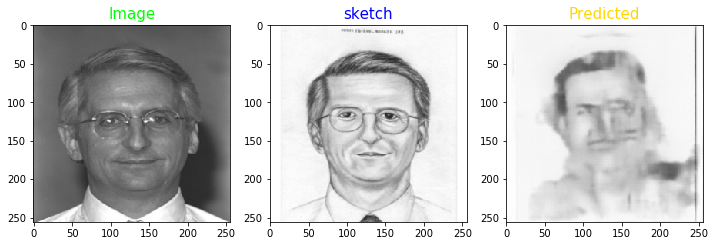

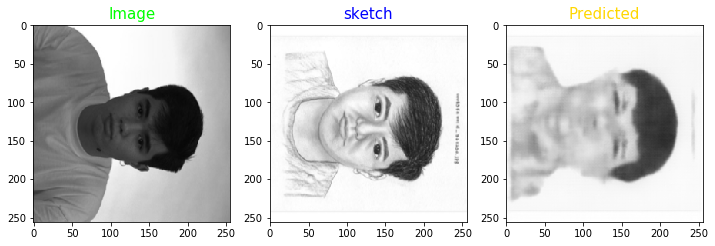

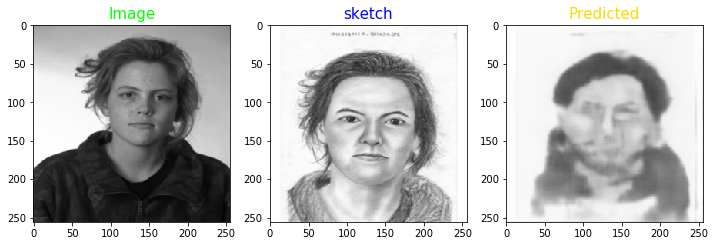

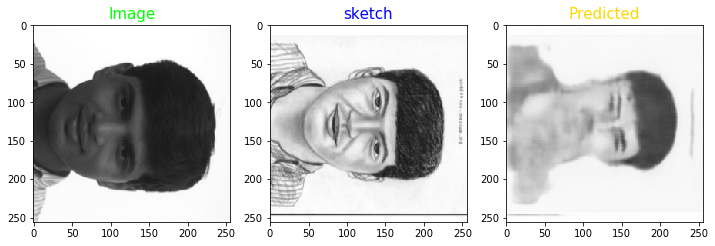

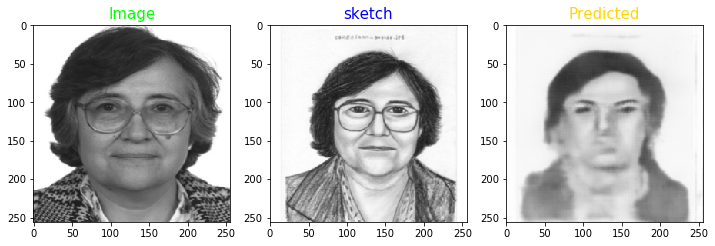

...

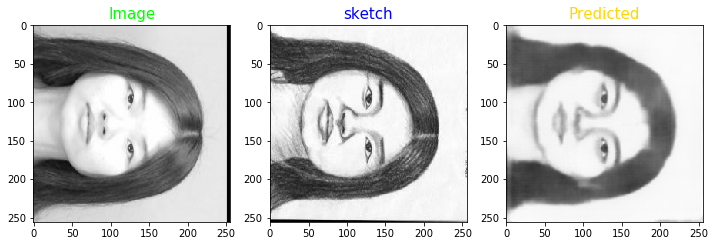

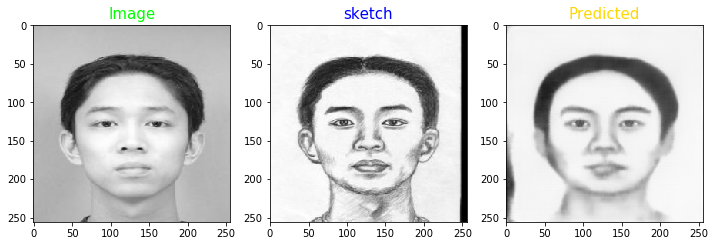

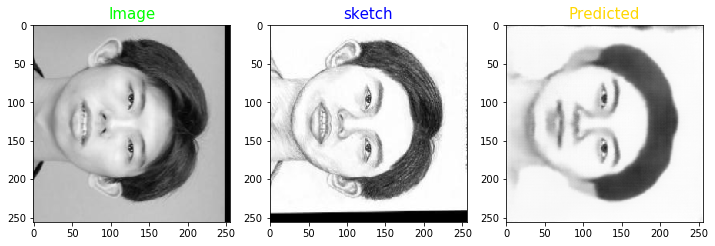

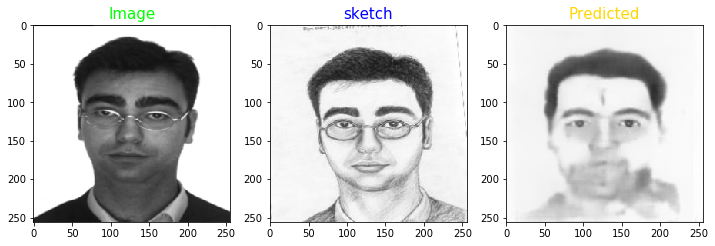

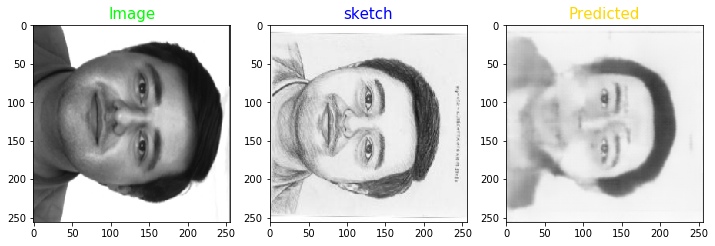

In [ ]:
ls = [i for i in range(0,10000,100)]
for i in ls:
    predicted =np.clip(model.predict(test_image[i].reshape(1,SIZE,SIZE,1)),0.0,1.0).reshape(SIZE,SIZE,1)
    show_images(test_image[i],test_sketch_image[i],predicted)

## Lastly, preducing the sketches for out dataset

In [ ]:
im_dir = '/home/guscerra@GU.GU.SE/aics-project/celeb_images/CelebA-HQ-img'

images_list = os.listdir('/home/guscerra@GU.GU.SE/aics-project/celeb_images/CelebA-HQ-img')

for img in images_list:

    celeb_img = cv2.imread(im_dir + '//' + img, cv2.IMREAD_GRAYSCALE)
    celeb_img = cv2.resize(celeb_img, (SIZE, SIZE))
    celeb_img = celeb_img.astype('float32') / 255.0
    predicted =np.clip(model.predict(celeb_img.reshape(1,SIZE,SIZE,1)),0.0,1.0).reshape(SIZE,SIZE,1)
    predicted = predicted * 255.0

    cv2.imwrite('/home/guscerra@GU.GU.SE/aics-project/puikus_sketchai/' + img, predicted)
